<a href="https://colab.research.google.com/github/EmiRoberti77/YOLO11_colac/blob/main/YOLO12_detection_emi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 16.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 82.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 35.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 35.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling 

In [2]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
from IPython.display import Image

In [4]:
model = YOLO("yolo12n.pt")

100%|██████████| 5.34M/5.34M [00:00<00:00, 24.1MB/s]


In [5]:
# download sample images and video
!gdown "https://drive.google.com/uc?id=1Xa1EJO_Uwv-qr0i72VK2TaQALz7X0EP1&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Xa1EJO_Uwv-qr0i72VK2TaQALz7X0EP1&confirm=t
To: /content/image.jpg
100% 214k/214k [00:00<00:00, 72.9MB/s]


In [6]:
!gdown "https://drive.google.com/uc?id=1l65gM2eQMhutLP9jpySZfaQIAB_OqO2j&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1l65gM2eQMhutLP9jpySZfaQIAB_OqO2j&confirm=t
To: /content/video.mp4
100% 3.14M/3.14M [00:00<00:00, 160MB/s]


In [7]:
result = model.predict("image.jpg")


image 1/1 /content/image.jpg: 448x640 9 persons, 1 bus, 2 traffic lights, 3 backpacks, 1 handbag, 461.7ms
Speed: 16.4ms preprocess, 461.7ms inference, 36.4ms postprocess per image at shape (1, 3, 448, 640)


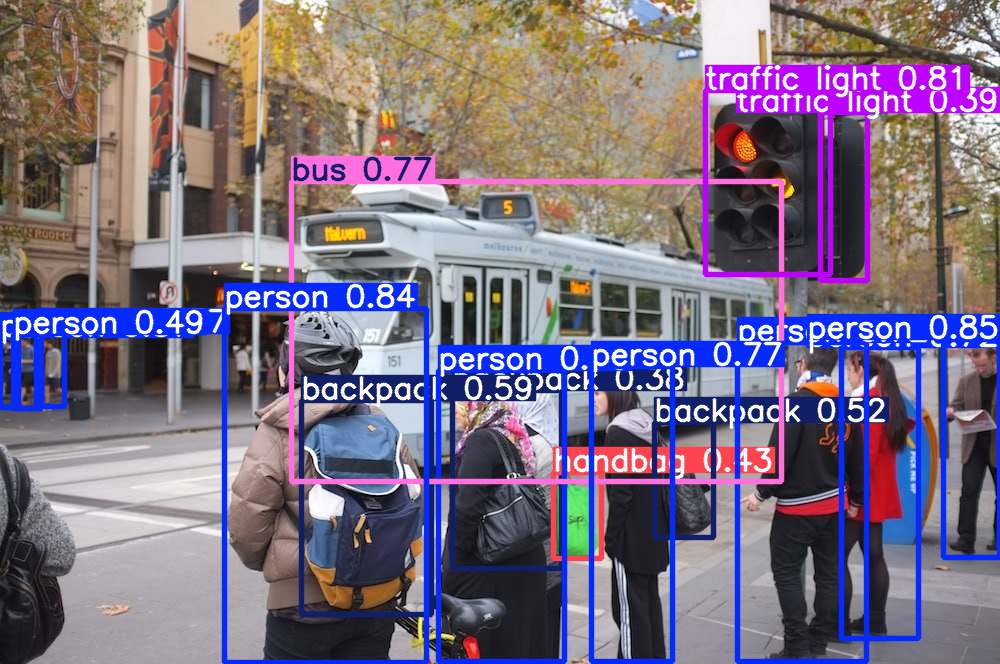

In [8]:
result[0].show()

In [12]:
# Save the model predictions

result = model.predict("image.jpg", save=True)


image 1/1 /content/image.jpg: 448x640 9 persons, 1 bus, 2 traffic lights, 3 backpacks, 1 handbag, 203.2ms
Speed: 5.1ms preprocess, 203.2ms inference, 2.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


In [13]:
# Predict more specific classes

result = model.predict("image.jpg", classes=[0,1], save=True)


image 1/1 /content/image.jpg: 448x640 9 persons, 208.6ms
Speed: 4.4ms preprocess, 208.6ms inference, 5.3ms postprocess per image at shape (1, 3, 448, 640)
Results saved to runs/detect/predict


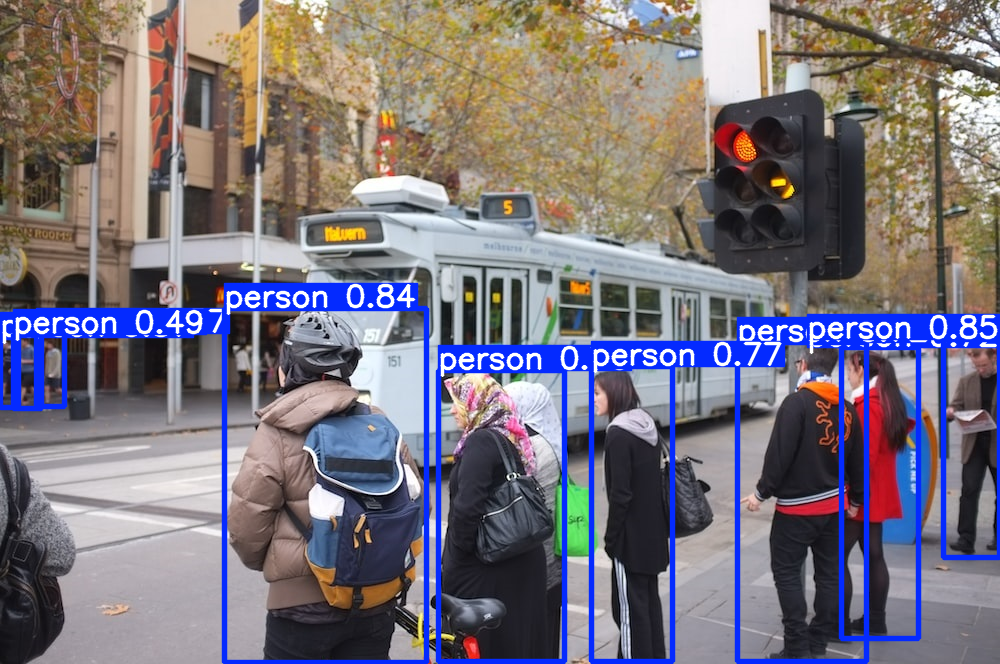

In [14]:
result[0].show()

In [15]:
# Run detection on a video

results = model.predict(source = "video.mp4", save = True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/458) /content/video.mp4: 384x640 11 persons, 11 bicycles, 202.0ms
video 1/1 (frame 2/458) /content/video.mp4: 384x640 13 persons, 12 bicycles, 165.1ms
video 1/1 (frame 3/458) /content/video.mp4: 384x640 13 persons, 13 bicycles, 173.6ms
video 1/1 (frame 4/458) /content/video.mp4: 384x640 13 persons, 13 bicycles, 166.4ms
video 1/1 (frame 5/458) /content/video.mp4: 384x640 13 persons, 12 bicycles, 180.3ms
video 1/1 (frame 6/458) /conten

In [16]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict/video.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)